In [1]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
from hloc.utils import viz_3d

from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_retrieval

## 从无序图像数据集中运行三维重建

配置路径和参数

In [2]:
my_datasets = ['House11', 'SportsHall']  # 11号楼、体育馆
my_dataset = my_datasets[1]
images = Path('datasets/'+my_dataset+'/database/')  # 对参考图像数据库运行三维重建
outputs = Path('datasets/'+my_dataset+'/outputs/')  # 与官方不同，将outputs放置在数据集文件夹中
assert images.exists(), "Dataset does not exist!"

sfm_pairs = outputs / 'pairs-netvlad.txt'
sfm_dir = outputs / 'sfm_superpoint+superglue'

retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

通过图像检索寻找图像对

In [3]:
# 由于数据集相对较大，使用NetVLAD提取全局描述符并寻找与每幅图像最相似的图像
# 若数据集较小，直接进行穷举匹配
retrieval_path = extract_features.main(retrieval_conf, images, outputs)
pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=5)

[2022/12/09 16:00:46 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2022/12/09 16:00:46 hloc INFO] Found 295 images in root datasets/SportsHall/database.
100%|██████████| 295/295 [00:29<00:00,  9.94it/s]
[2022/12/09 16:01:29 hloc INFO] Finished exporting features.
[2022/12/09 16:01:29 hloc INFO] Extracting image pairs from a retrieval database.
[2022/12/09 16:01:29 hloc INFO] Found 1475 pairs.


提取并匹配局部特征

In [4]:
feature_path = extract_features.main(feature_conf, images, outputs)
match_path = match_features.main(matcher_conf, sfm_pairs, feature_conf['output'], outputs)

[2022/12/09 16:01:36 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
[2022/12/09 16:01:36 hloc INFO] Found 295 images in root datasets/SportsHall/database.


Loaded SuperPoint model


100%|██████████| 295/295 [00:12<00:00, 24.11it/s]
[2022/12/09 16:01:48 hloc INFO] Finished exporting features.
[2022/12/09 16:01:48 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 889/889 [01:42<00:00,  8.69it/s]
[2022/12/09 16:03:34 hloc INFO] Finished exporting matches.


运行COLMAP

In [5]:
model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path)

[2022/12/09 16:03:41 hloc INFO] Creating an empty database...
[2022/12/09 16:03:41 hloc INFO] Importing images into the database...
[2022/12/09 16:03:51 hloc INFO] Importing features into the database...
100%|██████████| 295/295 [00:00<00:00, 545.70it/s]
[2022/12/09 16:03:52 hloc INFO] Importing matches into the database...
100%|██████████| 1475/1475 [00:02<00:00, 572.33it/s] 
[2022/12/09 16:03:55 hloc INFO] Performing geometric verification of the matches...
[2022/12/09 16:04:07 hloc INFO] Running 3D reconstruction...
W1209 16:14:02.805872 3580759 levenberg_marquardt_strategy.cc:116] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W1209 16:14:02.808238 3580759 levenberg_marquardt_strategy.cc:116] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
[2022/12/09 16:15:38 hloc INFO] Reconstructed 1 model(s).
[2022/12/09 16:15:38 hloc INFO] Largest model is #0 with 29

## 三维重建结果可视化

In [1]:
# 3D可视化
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

NameError: name 'viz_3d' is not defined

/data1/liushixian/dzp/HLOC/hloc/utils/viz.py:41: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



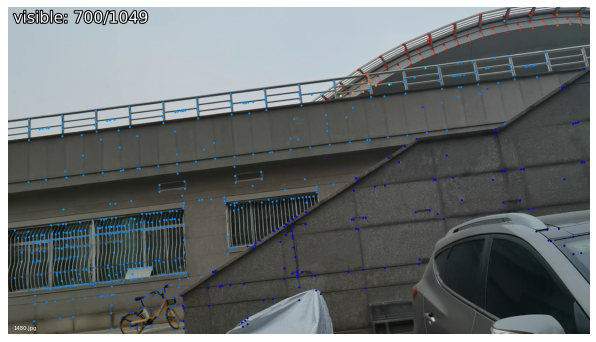

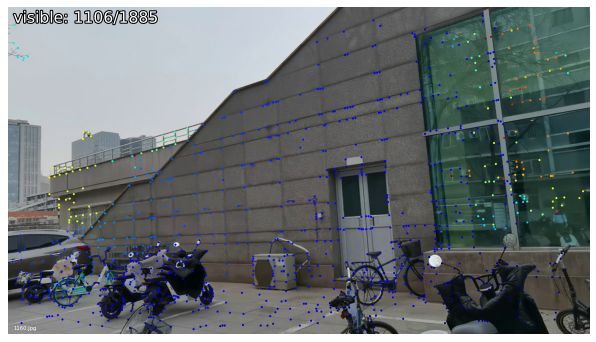

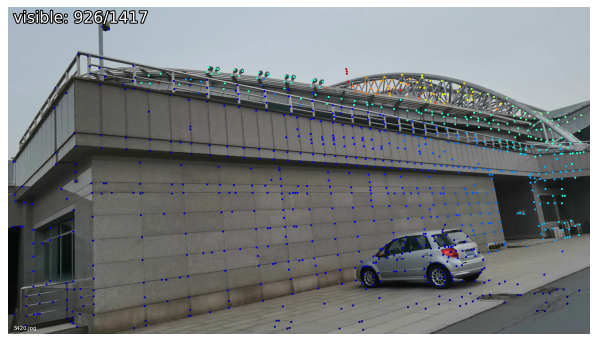

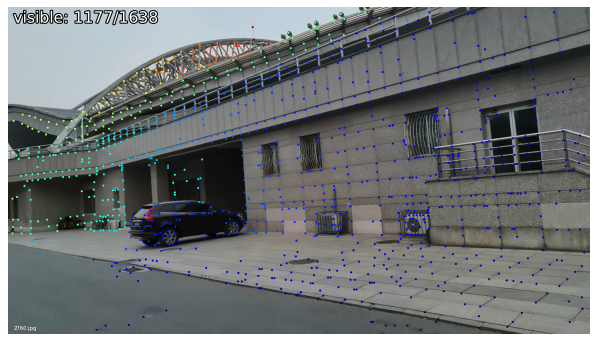

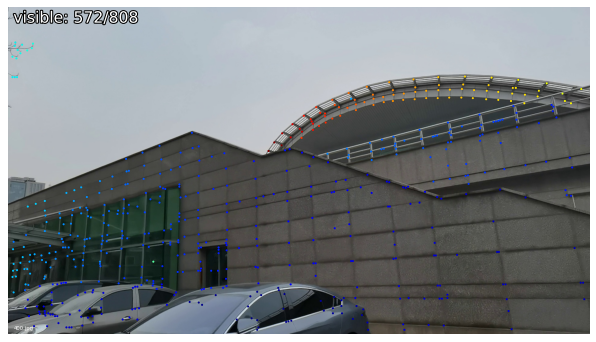

...

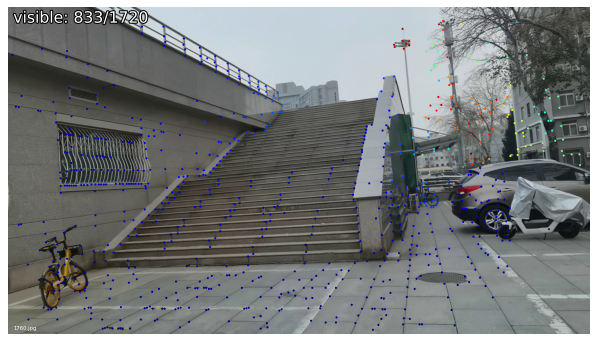

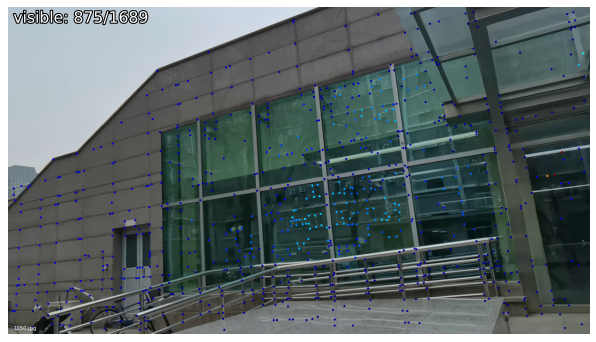

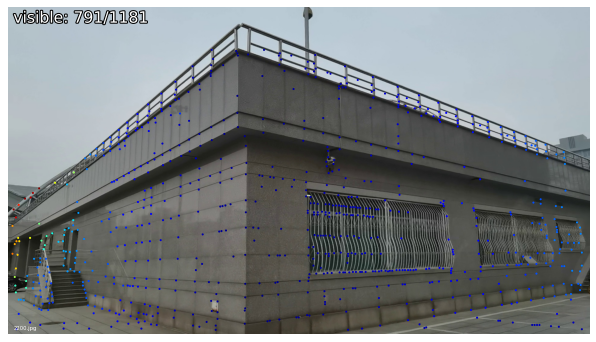

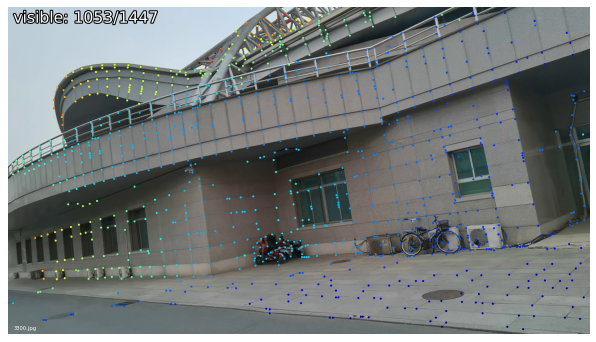

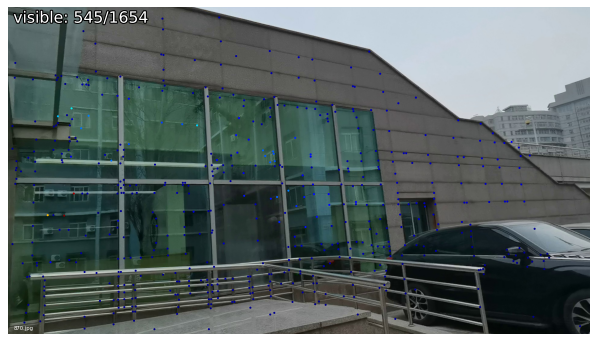

In [7]:
visualization.visualize_sfm_2d(model, images, color_by='depth', n=30)